# Chapter 6 Neuro Network Training Tips

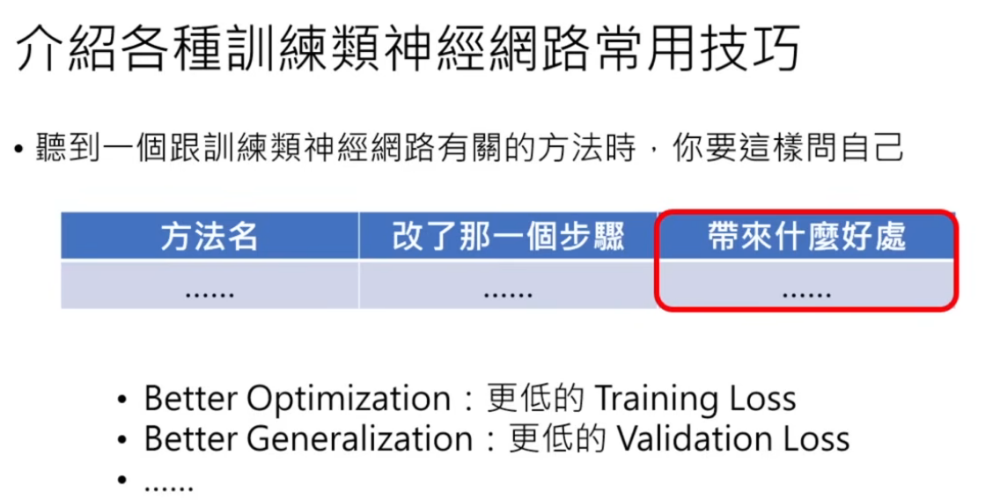

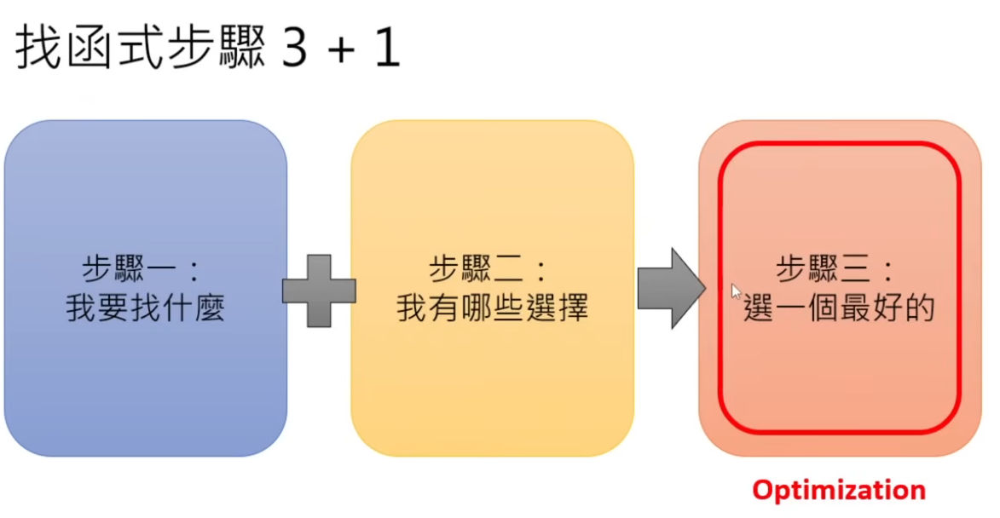

## Skills or Technologies to improve the optimization in step 3

### Recall: Vanilla Gradient Descent  (Vanilla means simple, no flavour)
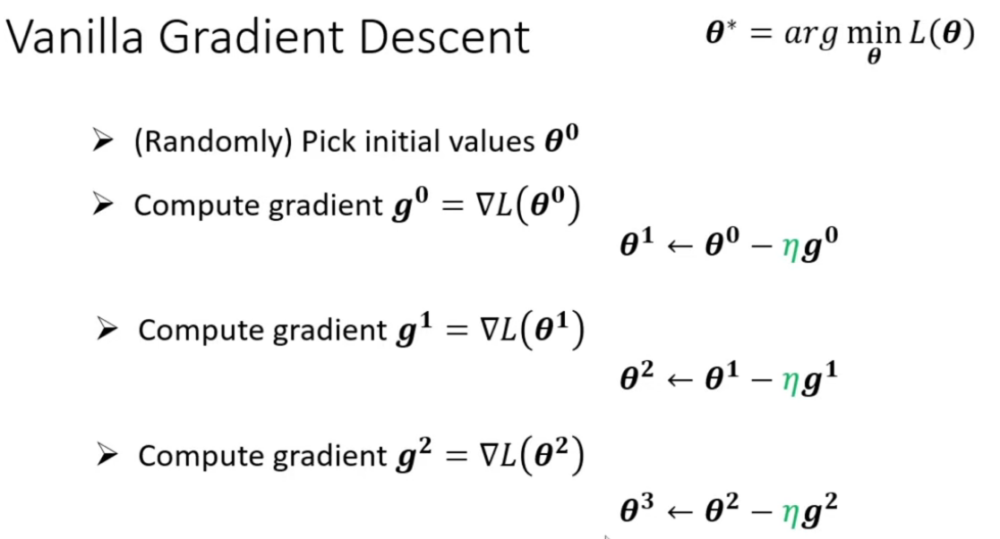

### Optimizer
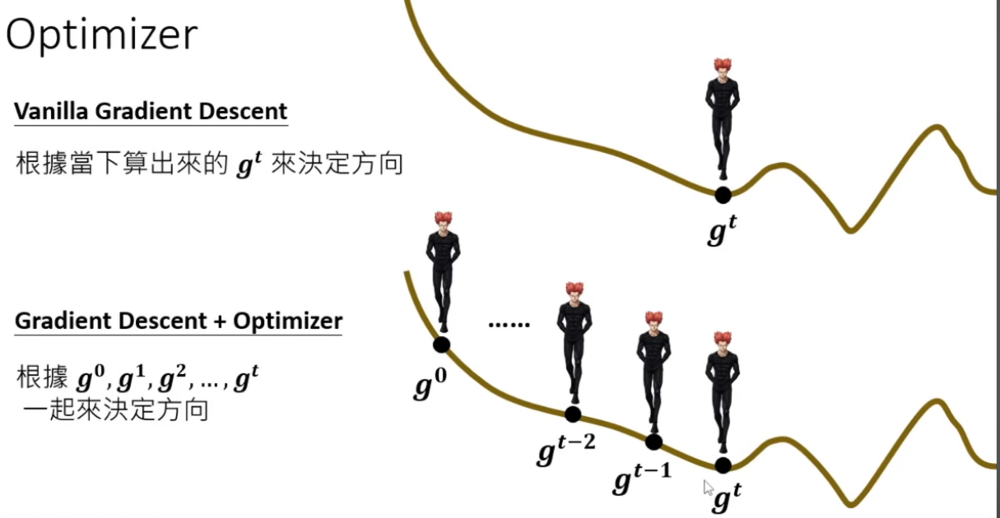

### Why Optimizer is required?
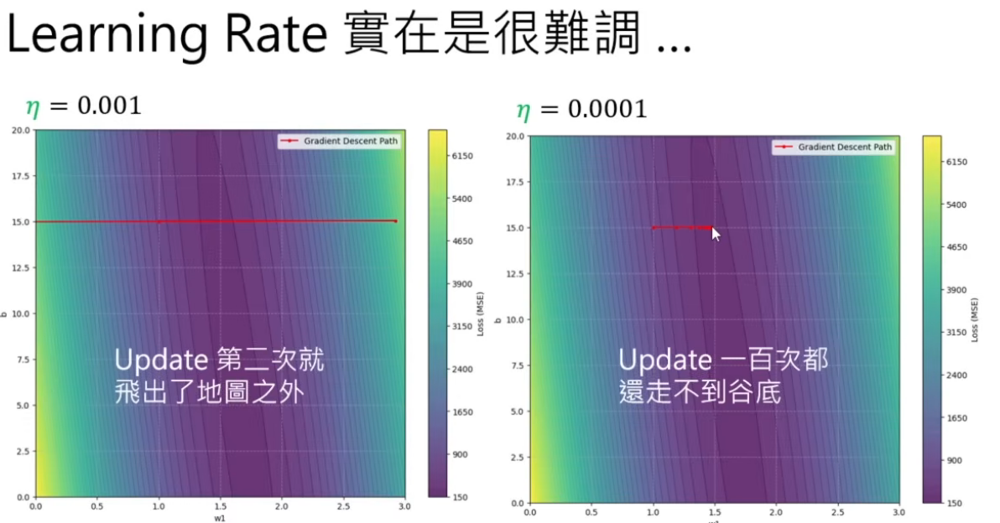

### How to decide the learning rate?
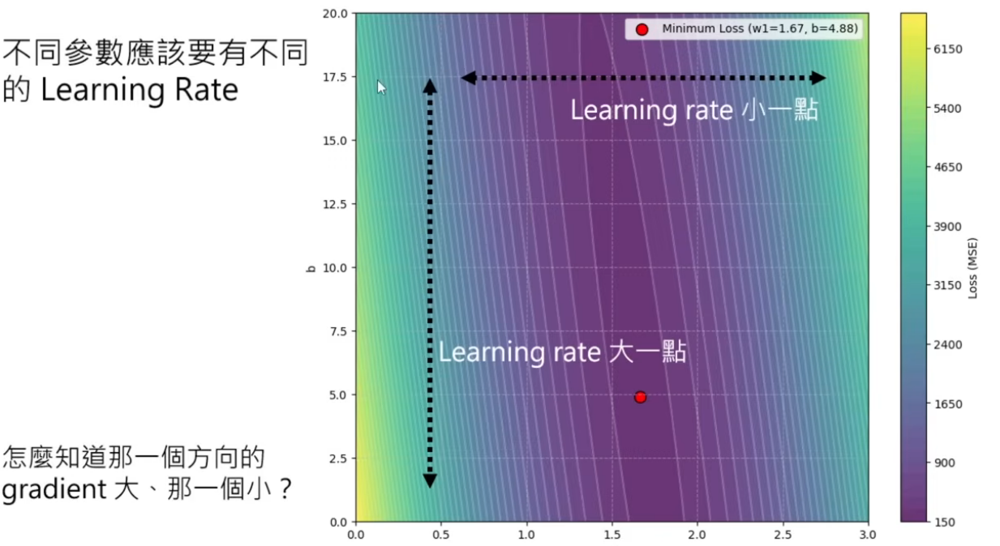
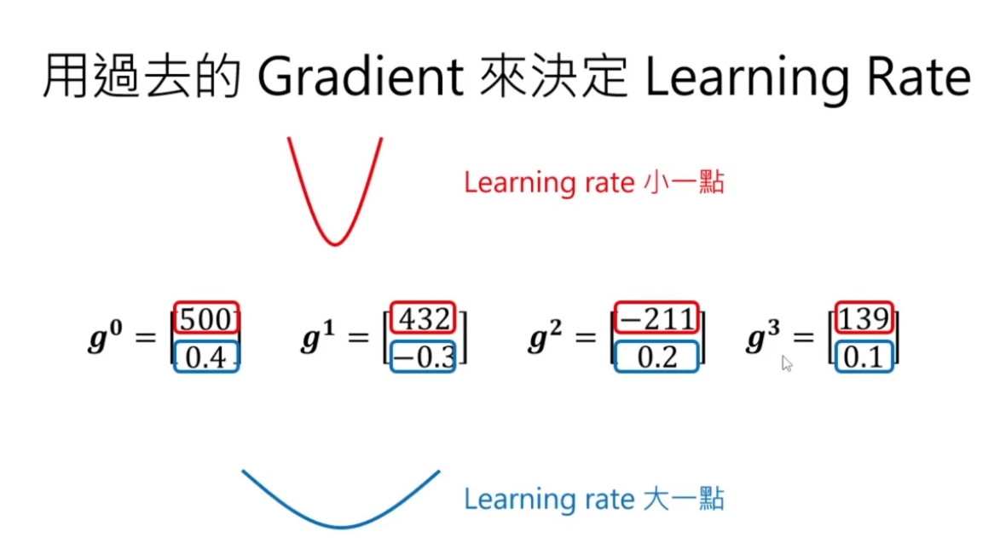

### Adagrad:  learning rate will be different for each iteration towards the calculation of gradient
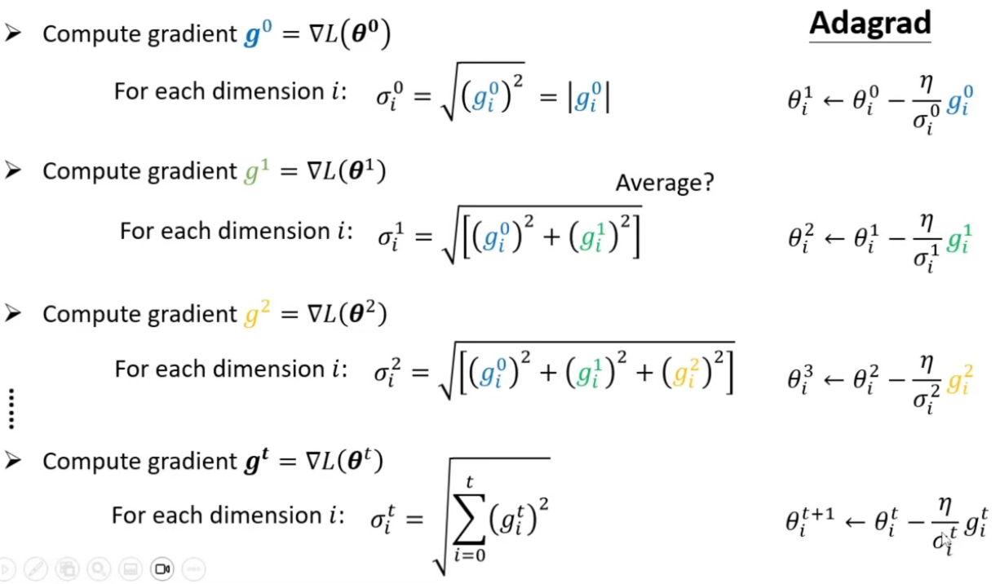
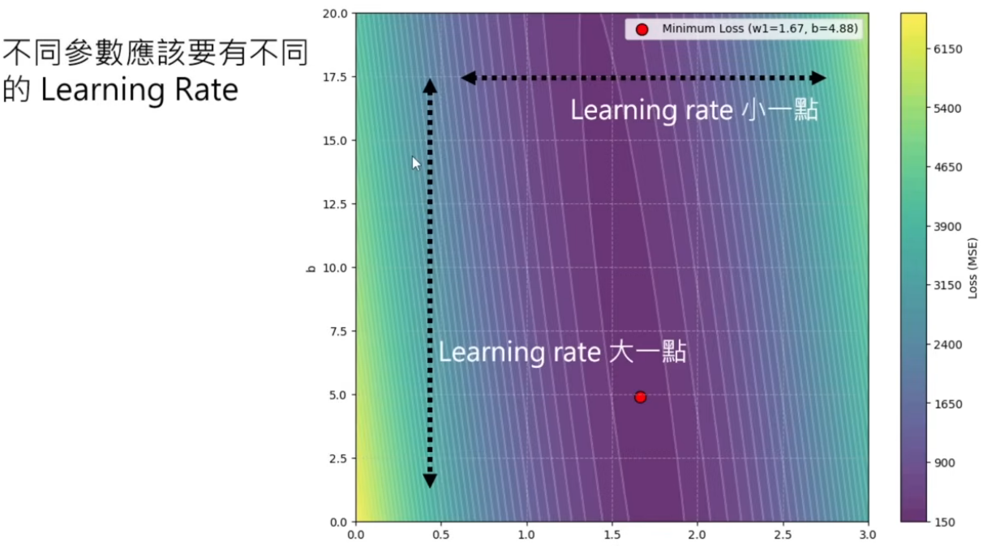

In [ ]:
# 匯入必要的函式庫
import numpy as np
import matplotlib.pyplot as plt

## 需要用到的資料
#《機器學習 2021》相關資料
page_2021 = np.array([61, 29, 16, 21, 19, 9, 35, 43, 14, 60, 95 ,67, 38 ,39 ,42, 16, 64, 34, 37, 57]) #投影片頁數
duration_2021 = np.array([109, 51, 34, 31, 38,19 ,56, 74, 31, 93, 160, 99, 49, 76, 72, 35, 165, 68, 86, 78]) #課程時長(分鐘)

#《生成式人工智慧導論2024》相關資料
page_2024 =    np.array([27, 22, 27, 50, 49, 16, 24, 37, 33, 27, 36, 27, 36 ,30 ,16 ,41 ,62, 34  ]) #投影片頁數
word_2024 = np.array([ 2236, 1457,1309, 3404,2513,764,1448,2327,2006,1224,1121,1042,1040,1029, 1048,1946,2631,1846 ]) #投影片總字數
duration_2024 =    np.array([35, 30, 26, 35, 47 ,25, 35 ,38 ,37, 25, 38, 45, 46, 32, 15, 45 ,87, 38]) #課程時長(分鐘)

### 以《機器學習 2021》資料進行訓練

In [ ]:
#訓練資料
x1_train = page_2021 #函式輸入
y_train = duration_2021 #正確答案

# 定義 Loss (Mean Squared Error)
def mean_squared_error(y_pred, y_true):
    """
    Calculate Mean Squared Error
    y_pred: Model's predicted values (a vector)
    y_true: True label values (a vector)
    """
    return np.mean((y_pred - y_true)**2)

# 定義我們的模型 (線性模型)
def linear_model(x1, w, b):
    """
    線性模型的預測函式
    x1: 輸入特徵 (投影片頁數)
    w, b: 參數
    """
    return w * x1 + b

# --- 繪製 Loss Surface 準備---

# 建立範圍
w_range = np.linspace(0, 3, 100)
b_range = np.linspace(0, 20, 300)
W, B = np.meshgrid(w_range, b_range)

# 建立空的 Loss 矩陣
losses = np.zeros((len(b_range), len(w_range)))

# 逐一計算每個 (w, b) 的 loss
for i, b in enumerate(b_range):
    for j, w in enumerate(w_range):
        y_pred = linear_model(x1_train, w, b)
        loss = mean_squared_error(y_pred, y_train)
        losses[i, j] = loss

以一般的 Gradient Descent 來訓練模型

In [ ]:
# --- 訓練模型 ---

# 設定超參數 (Hyperparameters)
learning_rate = 0.0001  # 學習率 (Learning Rate) 太小了嗎？但是再大就會炸裂了!
#學習率太大：步伐過大，可能一步就跨過山谷，跑到對面更高的山坡上，導致 Loss 不降反升，甚至發散。
#學習率太小：就像蝸牛在爬，雖然方向很穩，但走到谷底可能要天荒地老。
epochs = 100      # 訓練回合數

# 初始參數
w = 1
b = 15

# 用來記錄訓練過程的 list
w_history = []
b_history = []
loss_history = []
w_history.append(w)
b_history.append(b)
y_pred = linear_model(x1_train, w, b)
current_loss = mean_squared_error(y_pred, y_train)
loss_history.append(current_loss)

# 訓練迴圈開始
N = float(len(x1_train)) # 資料點的數量
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    y_pred = linear_model(x1_train, w, b)
    grad_w = (2/N) * np.sum((y_pred - y_train) * x1_train)
    grad_b = (2/N) * np.sum(y_pred - y_train)

    # 更新參數 (更新大小取決於學習率大小和梯度大小)
    w = w - learning_rate * grad_w
    b = b - learning_rate * grad_b

    # 記錄下目前的參數和 loss
    w_history.append(w)
    b_history.append(b)
    y_pred = linear_model(x1_train, w, b)
    current_loss = mean_squared_error(y_pred, y_train)
    loss_history.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface ---

# 建立範圍
w_range = np.linspace(0, 3, 100)
b_range = np.linspace(0, 20, 300)

w_range = np.linspace(0, 3, 100)
b_range = np.linspace(0, 20, 300)
W, B = np.meshgrid(w_range, b_range)

# 建立空的 Loss 矩陣
losses = np.zeros((len(b_range), len(w_range)))

# 逐一計算每個 (w, b) 的 loss
for i, b in enumerate(b_range):
    for j, w in enumerate(w_range):
        y_pred = linear_model(x1_train, w, b)
        loss = mean_squared_error(y_pred, y_train)
        losses[i, j] = loss

#在 Loss Surface 上畫出梯度下降的路徑
plt.figure(figsize=(10, 8))
contour = plt.contourf(W, B, losses, levels=50, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss')
plt.plot(w_history, b_history, 'r-o', markersize=3, label='Vanilla Gradient Descent')
plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.show()

以 Adagrad 來訓練模型

In [ ]:
# mean_squared_error 和 linear_model 的定義沿用前面的儲存格

# 定義 Adagrad 優化器
def adagrad_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate, epsilon=1e-8):
    """
    w, b: 當前參數
    grad_w, grad_b: 當前梯度
    grad_w_square, grad_b_square: 累積的平方梯度
    learning_rate: 學習率
    epsilon: 避免除以零的小數
    """
    # 累積平方梯度
    grad_w_square += grad_w**2
    grad_b_square += grad_b**2

    # 更新參數
    w -= learning_rate * grad_w / (np.sqrt(grad_w_square) + epsilon)
    b -= learning_rate * grad_b / (np.sqrt(grad_b_square) + epsilon)

    return w, b, grad_w_square, grad_b_square

# 設定超參數
learning_rate = 1  # Adagrad 的學習率通常可以設得比較大
epochs = 100

grad_w_square = 0
grad_b_square = 0

# 初始參數
w = 1
b = 15

# 用來記錄訓練過程的 list
w_history_adagrad = []
b_history_adagrad = []
loss_history_adagrad = []
w_history_adagrad.append(w)
b_history_adagrad.append(b)
y_pred = linear_model(x1_train, w, b)
current_loss = mean_squared_error(y_pred, y_train)
loss_history_adagrad.append(current_loss)

# 訓練迴圈開始
N = float(len(x1_train)) # 資料點的數量
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    y_pred = linear_model(x1_train, w, b)
    grad_w = (2/N) * np.sum((y_pred - y_train) * x1_train)
    grad_b = (2/N) * np.sum(y_pred - y_train)

    # 使用 Adagrad 更新參數
    w, b, grad_w_square, grad_b_square = adagrad_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate)

    # 記錄下目前的參數和 loss
    w_history_adagrad.append(w)
    b_history_adagrad.append(b)
    y_pred = linear_model(x1_train, w, b)
    current_loss = mean_squared_error(y_pred, y_train)
    loss_history_adagrad.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface 與 Adagrad 路徑 ---

plt.figure(figsize=(10, 8))
# 沿用前面儲存格計算的 Loss Surface 範圍和 Losses 矩陣
# w_range, b_range, losses

W, B = np.meshgrid(w_range, b_range)
contour = plt.contourf(W, B, losses, levels=50, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss')

# 繪製 Adagrad 的梯度下降路徑
plt.plot(w_history_adagrad, b_history_adagrad, 'r-o', markersize=3, label='Adagrad Path') # Adagrad 路徑

plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.show()

If the loss surface is irregular, for instance, the banana shape of gradient descent, the learning rate is too large, the model will not converge.
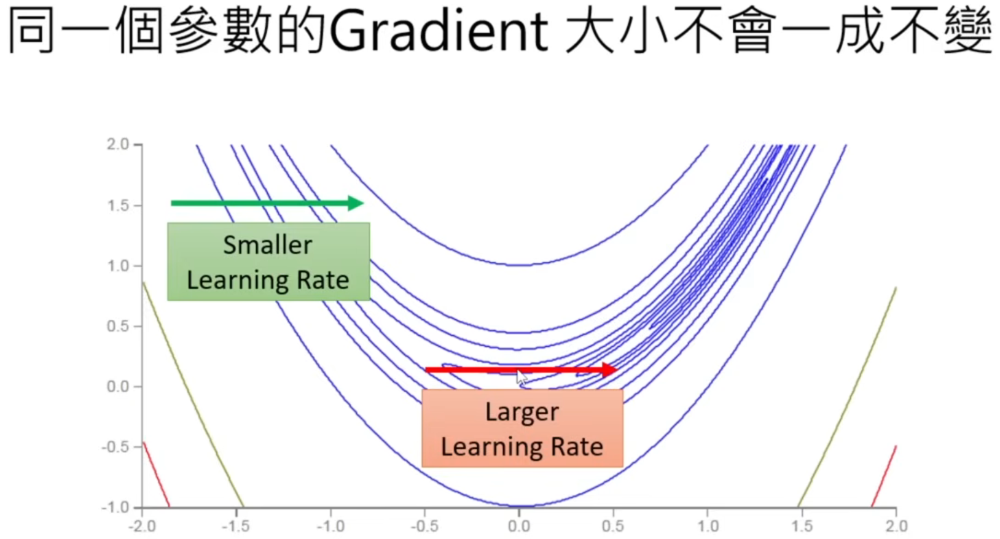

What can we do to solve this problem that Adagrad produces?
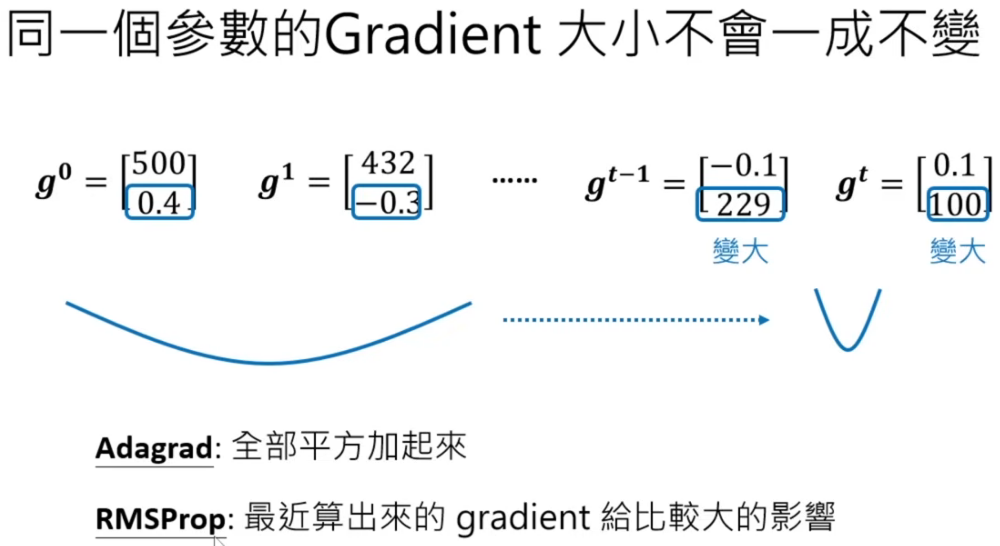

Make use of a weight that lies between 0 and 1, and the value depict the importance of all historical information or the latest information.
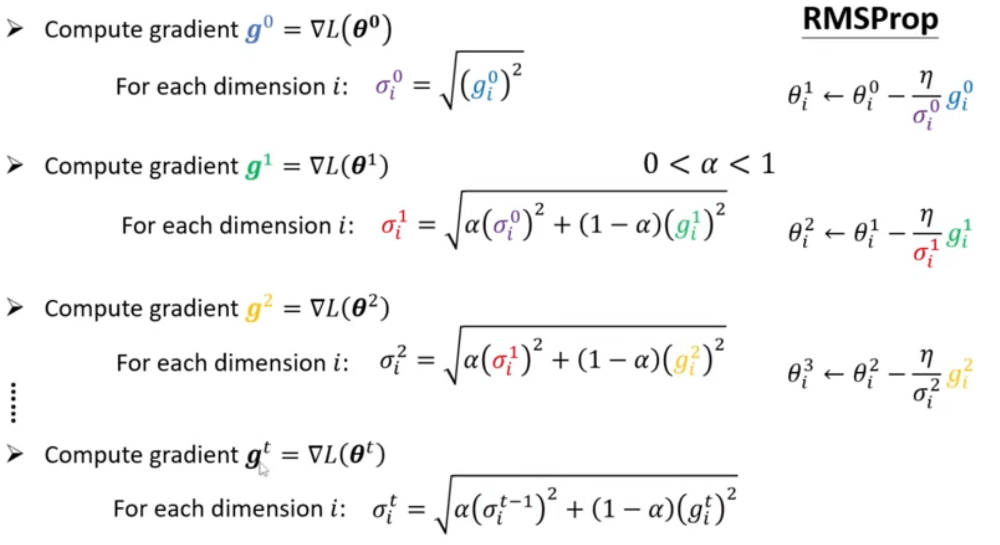

## 在香蕉函式 (Rosenbrock function) 上進行 Optimization

準備香蕉函式

In [ ]:
# 以下自定義一個 Loss Surface
def rosenbrock_function(w, b):
    return (1 - w)**2 + 100 * (b - w**2)**2

def gradient_rosenbrock(w, b):
    grad_w = -2 * (1 - w) - 4 * 100 * w * (b - w**2)
    grad_b = 2 * 100 * (b - w**2)
    return grad_w, grad_b

# 建立 w 和 b 的範圍
w_range = np.linspace(-2, 2, 100)
b_range = np.linspace(-1, 3, 100)

# 建立網格
W, B = np.meshgrid(w_range, b_range)

# 計算對應的 Loss 值
losses = rosenbrock_function(W, B)

# 繪製等高線圖
plt.figure(figsize=(10, 8))
contour = plt.contourf(W, B, losses, levels=200, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Rosenbrock Function Value')

# 標出最小值 (1, 1)
plt.plot(1, 1, 'r*', markersize=10, label='Minimum')

# 設定標籤
plt.xlabel('w')
plt.ylabel('b')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend() # 顯示圖例以標示最小值

plt.show()

以 Adagrad 來訓練模型

In [ ]:
# 定義 Adagrad 優化器
def adagrad_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate, epsilon=1e-8):
    """
    w, b: 當前參數
    grad_w, grad_b: 當前梯度
    grad_w_square, grad_b_square: 累積的平方梯度
    learning_rate: 學習率
    epsilon: 避免除以零的小數
    """
    # 累積平方梯度
    grad_w_square += grad_w**2
    grad_b_square += grad_b**2

    # 更新參數
    w -= learning_rate * grad_w / (np.sqrt(grad_w_square) + epsilon)
    b -= learning_rate * grad_b / (np.sqrt(grad_b_square) + epsilon)

    return w, b, grad_w_square, grad_b_square

# 設定超參數 (Hyperparameters)
learning_rate = 1  # Adagrad 的學習率通常可以設得比較大
epochs = 1000

grad_w_square = 0
grad_b_square = 0

# 初始參數
w = -2
b = 2.5

# 用來記錄訓練過程的 list
w_history_adagrad = []
b_history_adagrad = []
loss_history_adagrad = []
w_history_adagrad.append(w)
b_history_adagrad.append(b)
current_loss = rosenbrock_function(w, b)
loss_history_adagrad.append(current_loss)

# 訓練迴圈開始
N = float(len(x1_train)) # 資料點的數量
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    grad_w,grad_b = gradient_rosenbrock(w, b)

    # 使用 Adagrad 更新參數
    w, b, grad_w_square, grad_b_square = adagrad_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate)

    # 記錄下目前的參數和 loss
    w_history_adagrad.append(w)
    b_history_adagrad.append(b)
    current_loss = rosenbrock_function(w, b)
    loss_history_adagrad.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- Adagrad 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface 與 Adagrad 路徑 ---

plt.figure(figsize=(10, 8))
# 沿用前面儲存格計算的 Loss Surface 範圍和 Losses 矩陣
# w_range, b_range, losses

W, B = np.meshgrid(w_range, b_range)
contour = plt.contourf(W, B, losses, levels=250, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss (MSE)')

# 繪製 Adagrad 的梯度下降路徑
plt.plot(w_history_adagrad, b_history_adagrad, 'r-o', markersize=3, label='Adagrad Path') # Adagrad 路徑

plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.title('Adagrad Path on Error Surface')
plt.show()

以 RMSProp 來訓練模型

In [ ]:
# 定義 RMSProp 優化器
def rmsprop_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate, alpha, epsilon=1e-8):
    """
    w, b: 當前參數
    grad_w, grad_b: 當前梯度
    grad_w_square, grad_b_square: 累積的平方梯度
    learning_rate: 學習率
    epsilon: 避免除以零的小數
    """
    # 累積平方梯度
    grad_w_square = alpha*grad_w_square + (1-alpha)*grad_w**2
    grad_b_square = alpha*grad_b_square + (1-alpha)*grad_b**2

    # 更新參數
    w -= learning_rate * grad_w / (np.sqrt(grad_w_square) + epsilon)
    b -= learning_rate * grad_b / (np.sqrt(grad_b_square) + epsilon)

    return w, b, grad_w_square, grad_b_square

# 設定超參數 (Hyperparameters)
learning_rate = 0.01 #再設更大的話訓練會不穩定
epochs = 1000
alpha = 0.9 #新的梯度的權重為 1-alpha

grad_w_square = 0
grad_b_square = 0

# 初始參數
w = -2
b = 2.5

# 用來記錄訓練過程的 list
w_history_rmsprop = []
b_history_rmsprop = []
loss_history_rmsprop = []
w_history_rmsprop.append(w)
b_history_rmsprop.append(b)
current_loss = rosenbrock_function(w, b)
loss_history_rmsprop.append(current_loss)

# 訓練迴圈開始
N = float(len(x1_train)) # 資料點的數量
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    grad_w,grad_b = gradient_rosenbrock(w, b)

    # 使用 Adagrad 更新參數
    w, b, grad_w_square, grad_b_square = rmsprop_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate, alpha)

    # 記錄下目前的參數和 loss
    w_history_rmsprop.append(w)
    b_history_rmsprop.append(b)
    current_loss = rosenbrock_function(w, b)
    loss_history_rmsprop.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- RMSProp 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface 與 RMSProp 路徑 ---

plt.figure(figsize=(10, 8))
# 沿用前面儲存格計算的 Loss Surface 範圍和 Losses 矩陣
# w_range, b_range, losses

W, B = np.meshgrid(w_range, b_range)
contour = plt.contourf(W, B, losses, levels=250, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss')

# 繪製梯度下降路徑
plt.plot(w_history_rmsprop, b_history_rmsprop, 'r-o', markersize=3, label='RMSProp Path') # Adagrad 路徑

plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.show()

## Rastrigin - 局部最小值陷阱
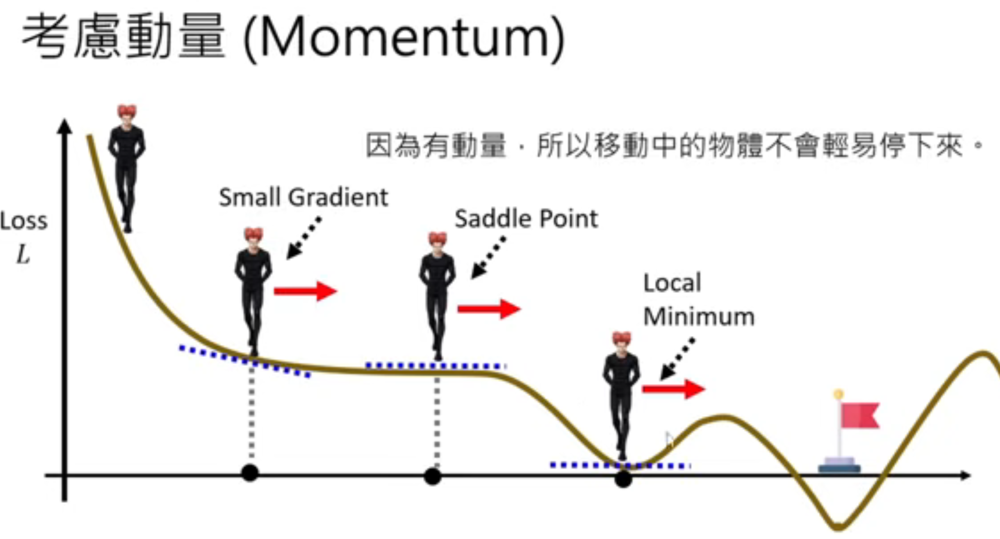

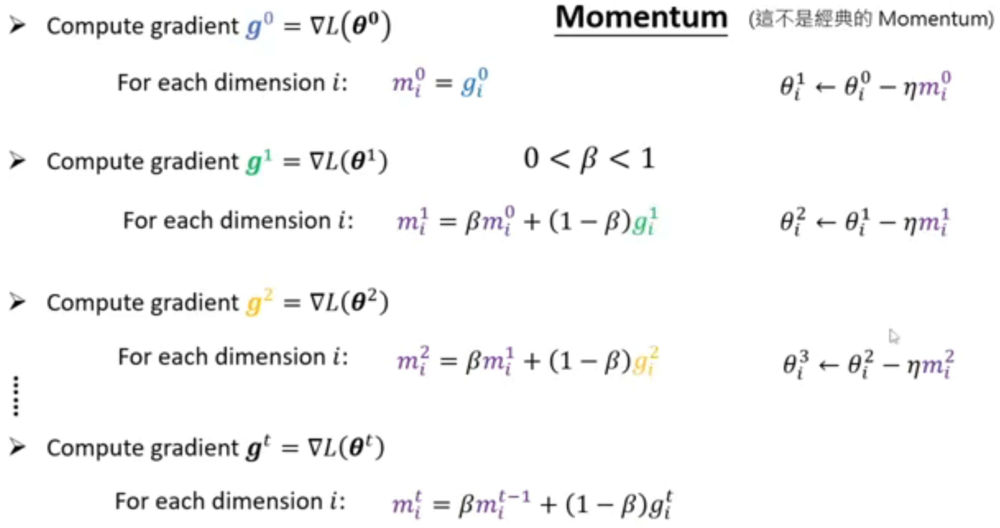


以 Rastrigin 函式作為最佳化的對象.  For instance, define a new loss surface with lots of local mininum.  The global minium is in the centre.

In [ ]:
# Rastrigin - 測試局部最小值陷阱
def rastrigin_function(w, b):
    return (w**2 - 10 * np.cos(2 * np.pi * w)) + \
           (b**2 - 10 * np.cos(2 * np.pi * b)) + 2 * 10

def gradient_rastrigin(w, b):
    grad_w = 2 * w + 2 * 10 * np.pi * np.sin(2 * np.pi * w)
    grad_b = 2 * b + 2 * 10 * np.pi * np.sin(2 * np.pi * b)
    return grad_w,grad_b

# 建立 w 和 b 的範圍
w_range = np.linspace(-3, 3, 300)
b_range = np.linspace(-3, 3, 300)

# 建立網格
W, B = np.meshgrid(w_range, b_range)

# 計算對應的 Loss 值
losses = rastrigin_function(W, B)

# 繪製等高線圖
plt.figure(figsize=(10, 8))
contour = plt.contourf(W, B, losses, levels=100, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Rosenbrock Function Value')

# 標出最小值 (0, 0)
plt.plot(0, 0, 'r*', markersize=10, label='Minimum')

# 設定標籤
plt.xlabel('w')
plt.ylabel('b')
plt.title('Contour Plot of Rosenbrock Function')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend() # 顯示圖例以標示最小值

plt.show()

以 RMSProp 來訓練模型

In [ ]:
# 設定超參數 (Hyperparameters)
learning_rate = 0.01
epochs = 1000
decay = 0.9

grad_w_square = 0
grad_b_square = 0

# 初始參數
w = -2.5
b = 2.5

# 用來記錄訓練過程的 list
w_history_rmsprop = []
b_history_rmsprop = []
loss_history_rmsprop = []
w_history_rmsprop.append(w)
b_history_rmsprop.append(b)
current_loss = rastrigin_function(w, b)
loss_history_rmsprop.append(current_loss)

# 訓練迴圈開始
N = float(len(x1_train)) # 資料點的數量
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    grad_w,grad_b = gradient_rastrigin(w, b)

    # 使用 Adagrad 更新參數
    w, b, grad_w_square, grad_b_square = rmsprop_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square, learning_rate, decay)

    # 記錄下目前的參數和 loss
    w_history_rmsprop.append(w)
    b_history_rmsprop.append(b)
    current_loss = rastrigin_function(w, b)
    loss_history_rmsprop.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- RMSProp 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface 與 Adagrad 路徑 ---

plt.figure(figsize=(10, 8))
# 沿用前面儲存格計算的 Loss Surface 範圍和 Losses 矩陣
# w_range, b_range, losses

W, B = np.meshgrid(w_range, b_range)
contour = plt.contourf(W, B, losses, levels=250, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss')

# 繪製梯度下降路徑
plt.plot(w_history_rmsprop, b_history_rmsprop, 'r-o', markersize=3, label='RMSProp Path') # Adagrad 路徑

plt.plot(w, b, 'y*', markersize=10, label='Stop Here')

plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.show()

以 Momentum 來訓練模型

In [ ]:
def momentum_optimizer(w, b, grad_w, grad_b, momentum_w, momentum_b, learning_rate, beta):
    """
    w, b: 當前參數
    grad_w, grad_b: 當前梯度
    momentum: 動量
    learning_rate: 學習率
    """
    # 累積動量
    momentum_w = beta * momentum_w + (1-beta)*grad_w
    momentum_b = beta * momentum_b + (1-beta)*grad_b

    # 更新參數
    w -= learning_rate * momentum_w
    b -= learning_rate * momentum_b

    return w, b, momentum_w, momentum_b

# 設定超參數 (Hyperparameters)
learning_rate = 0.01
epochs = 1000
beta = 0.995 #新的梯度的權重是 1-beta

momentum_w = 0
momentum_b = 0

# 初始參數
w = -2.5
b = 2.5

# 用來記錄訓練過程的 list
w_history_momentum = []
b_history_momentum = []
loss_history_momentum = []
w_history_momentum.append(w)
b_history_momentum.append(b)
current_loss = rastrigin_function(w, b)
loss_history_momentum.append(current_loss)

# 訓練迴圈開始
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    grad_w,grad_b = gradient_rastrigin(w, b)

    # 使用 momentum 更新參數
    w, b, momentum_w, momentum_b = momentum_optimizer(w, b, grad_w, grad_b, momentum_w, momentum_b, learning_rate, beta)

    # 記錄下目前的參數和 loss
    w_history_momentum.append(w)
    b_history_momentum.append(b)
    current_loss = rastrigin_function(w, b)
    loss_history_momentum.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- Momentum 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface 與 Momentum 路徑 ---

plt.figure(figsize=(10, 8))
# 沿用前面儲存格計算的 Loss Surface 範圍和 Losses 矩陣
# w_range, b_range, losses

W, B = np.meshgrid(w_range, b_range)
contour = plt.contourf(W, B, losses, levels=250, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss')

# 繪製梯度下降路徑
plt.plot(w_history_momentum, b_history_momentum, 'r-o', markersize=3, label='Momentum Path')


plt.plot(w, b, 'y*', markersize=10, label='Stop Here')

plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.show()

## Adam
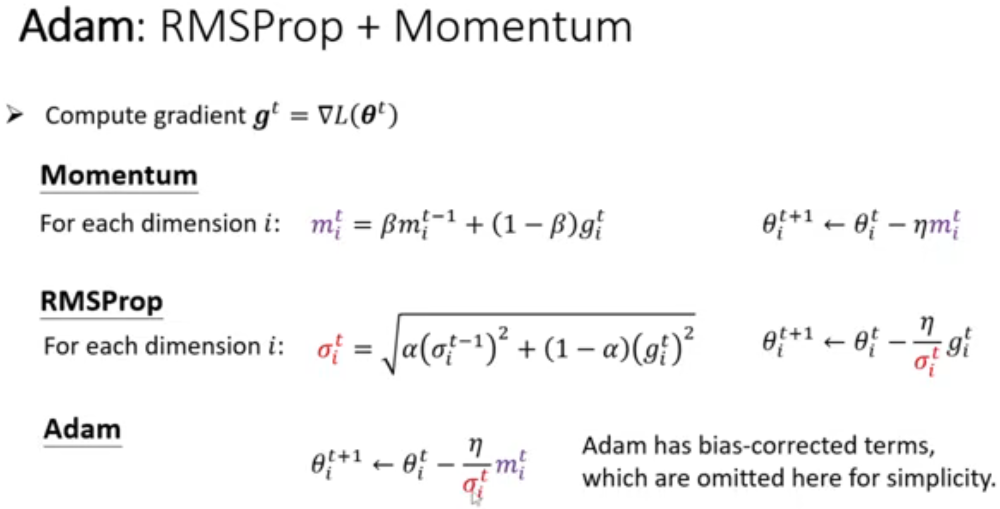

## 換回香蕉函式
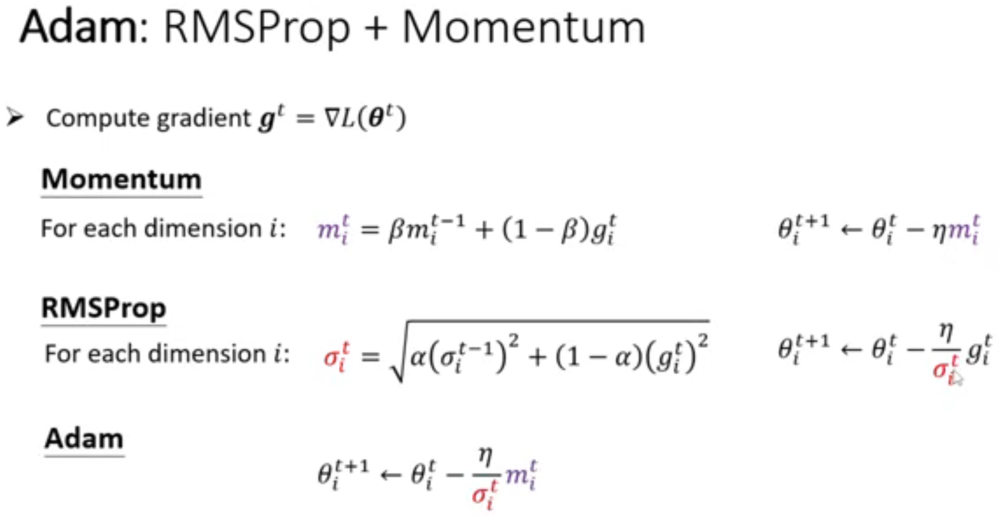

In [ ]:
# 以下自定義一個 Loss Surface
def rosenbrock_function(w, b):
    return (1 - w)**2 + 100 * (b - w**2)**2

def gradient_rosenbrock(w, b):
    grad_w = -2 * (1 - w) - 4 * 100 * w * (b - w**2)
    grad_b = 2 * 100 * (b - w**2)
    return grad_w, grad_b

# 建立 w 和 b 的範圍
w_range = np.linspace(-2, 2, 100)
b_range = np.linspace(-1, 3, 100)

# 建立網格
W, B = np.meshgrid(w_range, b_range)

# 計算對應的 Loss 值
losses = rosenbrock_function(W, B)

以 Adam 進行訓練

In [ ]:
#注意：此處實作的並非正版 Adam ，而是簡化過的版本
def adam_optimizer(w, b, grad_w, grad_b, grad_w_square, grad_b_square,  momentum_w, momentum_b, learning_rate, alpha, beta, epsilon=1e-8):
    """
    w, b: 當前參數
    grad_w, grad_b: 當前梯度
    grad_w_square, grad_b_square: 累積的平方梯度
    momentum_w, momentum_b: 動量
    learning_rate: 學習率
    """
    t = epoch +1

    # 累積平方梯度
    grad_w_square = alpha*grad_w_square + (1-alpha)*grad_w**2
    grad_b_square = alpha*grad_b_square + (1-alpha)*grad_b**2

    # 累積動量
    momentum_w = beta * momentum_w + (1-beta)*grad_w
    momentum_b = beta * momentum_b + (1-beta)*grad_b

    # 更新參數
    w -= learning_rate * momentum_w / (np.sqrt(grad_w_square) + epsilon)
    b -= learning_rate * momentum_b / (np.sqrt(grad_b_square) + epsilon)

    return w, b,  grad_w_square, grad_b_square, momentum_w, momentum_b

# 設定超參數 (Hyperparameters)
learning_rate = 0.01
epochs = 1000
alpha = 0.9
beta = 0.9

grad_w_square = 0
grad_b_square = 0
momentum_w = 0
momentum_b = 0

# 初始參數
w = -2
b = 2

# 用來記錄訓練過程的 list
w_history_adam = []
b_history_adam = []
loss_history_adam = []
w_history_adam.append(w)
b_history_adam.append(b)
current_loss = rosenbrock_function(w, b)
loss_history_adam.append(current_loss)

# 訓練迴圈開始
for epoch in range(epochs):

    # 計算梯度 (偏微分的結果)
    grad_w,grad_b = gradient_rosenbrock(w, b)

    # 使用 momentum 更新參數
    w, b,  grad_w_square, grad_b_square,momentum_w, momentum_b = \
     adam_optimizer(w, b, grad_w, grad_b,  grad_w_square, grad_b_square,momentum_w, momentum_b, learning_rate, alpha, beta)

    # 記錄下目前的參數和 loss
    w_history_adam.append(w)
    b_history_adam.append(b)
    current_loss = rosenbrock_function(w, b)
    loss_history_adam.append(current_loss)

    # 印出目前狀況
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {current_loss:.4f}, w: {w:.4f}, b: {b:.4f}")

print("\n--- 訓練完成 ---")
print(f"最終訓練結果: w ≈ {w:.4f}, b ≈ {b:.4f}")

# --- 繪製 Loss Surface 與 Adam 路徑 ---

plt.figure(figsize=(10, 8))
# 沿用前面儲存格計算的 Loss Surface 範圍和 Losses 矩陣
# w_range, b_range, losses

W, B = np.meshgrid(w_range, b_range)
contour = plt.contourf(W, B, losses, levels=250, cmap='viridis', alpha=0.8)
plt.colorbar(contour, label='Loss')

# 繪製梯度下降路徑
plt.plot(w_history_adam, b_history_adam, 'r-o', markersize=3)

plt.plot(w, b, 'y*', markersize=10, label='Stop Here')

plt.xlabel('w')
plt.ylabel('b')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.xlim(w_range.min(), w_range.max())
plt.ylim(b_range.min(), b_range.max())
plt.show()


46:57

### 以《生成式AI導論 2024》資料進行訓練

In [ ]:
#訓練資料
x1_train = page_2024
x2_train = word_2024/page_2024 #平均字數
y_train = duration_2024

In [ ]:
# 訓練類神經網路

def relu(x):
    return np.maximum(0, x)

def nn_forward(X, W, b, Wp, bp):
    """
    X:  (2, N)
    W:  (H, 2)
    b:  (H, 1)
    Wp: (1, H)
    bp: (1, 1)
    A: (H,N)
    Z: (H,N)
    回傳:
      y_pred: (1, N)
      cache:  訓練時需要的中間值
    """
    Z = W @ X + b        # (H, N)
    A = relu(Z)          # (H, N)
    y_pred = Wp @ A + bp    # (1, N)
    cache = (X, Z, A)
    return y_pred, cache

def relu_grad(x):
    return (x > 0)

def nn_backward(dy, cache, W, b, Wp, bp):
    """
    dy:     (1, N) = dL/d(y_pred)
    cache:  (X, Z, A)
    回傳:   dW, db, dWp, dbp 與各自形狀相同
    """
    X, Z, A = cache
    # 輸出層：y = Wp @ A + bp
    dWp = dy @ A.T                  # (1, N) @ (N, H) = (1, H)
    dbp = dy.sum(axis=1, keepdims=True)  # (1, 1)
    dA  = Wp.T @ dy                 # (H, 1) @ (1, N) = (H, N)

    # 隱藏層：A = ReLU(Z)
    dZ = dA * relu_grad(Z)          # (H, N)

    # 第一層：Z = W @ X + b
    dW = dZ @ X.T                   # (H, N) @ (N, 2) = (H, 2)
    db = dZ.sum(axis=1, keepdims=True)   # (H, 1)

    return dW, db, dWp, dbp

In [ ]:
H = 100            # 隱藏層大小，可自行調整
in_dim = 2        # 輸入維度 x1, x2
out_dim = 1       # 輸出維度

# 刻意不固定隨機種子，顯示初始對於結果的影響
W = np.random.randn(H, in_dim)
b = np.random.randn(H,1)
Wp = np.random.randn(out_dim, H)
bp = np.random.randn(out_dim,1)

# === Adam 參數 ===
learning_rate_nn = 0.01
epochs_nn = 10000
beta1 = 0.9
beta2 = 0.999
eps = 1e-8

loss_history = []

N_train = float(len(x1_train))

# 初始化 Adam 的一階與二階動量
mW = np.zeros_like(W)
mb = np.zeros_like(b)
mWp = np.zeros_like(Wp)
mbp = np.zeros_like(bp)

vW = np.zeros_like(W)
vb = np.zeros_like(b)
vWp = np.zeros_like(Wp)
vbp = np.zeros_like(bp)

for epoch in range(1, epochs_nn + 1):

    # forward
    X = np.vstack((x1_train, x2_train))
    y_pred, cache = nn_forward(X, W, b, Wp, bp)
    dy = (2.0 / N_train) * (y_pred - y_train)

    # backward
    dW, db, dWp, dbp = nn_backward(dy, cache, W, b, Wp, bp)

    # === Adam 更新 ===
    # 更新一階動量 (m)
    mW = beta1 * mW + (1 - beta1) * dW
    mb = beta1 * mb + (1 - beta1) * db
    mWp = beta1 * mWp + (1 - beta1) * dWp
    mbp = beta1 * mbp + (1 - beta1) * dbp

    # 更新二階動量 (v)
    vW = beta2 * vW + (1 - beta2) * (dW ** 2)
    vb = beta2 * vb + (1 - beta2) * (db ** 2)
    vWp = beta2 * vWp + (1 - beta2) * (dWp ** 2)
    vbp = beta2 * vbp + (1 - beta2) * (dbp ** 2)

    # 偏差修正 (bias correction)
    mW_hat = mW / (1 - beta1 ** epoch)
    mb_hat = mb / (1 - beta1 ** epoch)
    mWp_hat = mWp / (1 - beta1 ** epoch)
    mbp_hat = mbp / (1 - beta1 ** epoch)

    vW_hat = vW / (1 - beta2 ** epoch)
    vb_hat = vb / (1 - beta2 ** epoch)
    vWp_hat = vWp / (1 - beta2 ** epoch)
    vbp_hat = vbp / (1 - beta2 ** epoch)

    # 更新參數
    W  -= learning_rate_nn * mW_hat / (np.sqrt(vW_hat) + eps)
    b  -= learning_rate_nn * mb_hat / (np.sqrt(vb_hat) + eps)
    Wp -= learning_rate_nn * mWp_hat / (np.sqrt(vWp_hat) + eps)
    bp -= learning_rate_nn * mbp_hat / (np.sqrt(vbp_hat) + eps)

    # 計算 Loss
    y_pred, cache = nn_forward(X, W, b, Wp, bp)
    loss = mean_squared_error(y_pred, y_train)
    loss_history.append(loss)

    print(f"Epoch [{epoch}/{epochs_nn}], Loss: {loss:.6f}")

In [ ]:
H = 100            # 隱藏層大小，可自行調整
in_dim = 2        # 輸入維度 x1, x2
out_dim = 1       # 輸出維度

#原來的 initializaation 方式
#W = np.random.randn(H, in_dim)
#b = np.random.randn(H,1)
#Wp = np.random.randn(out_dim, H)
#bp = np.random.randn(out_dim,1)

# 改變初始化隨機取樣的方法
# 刻意不固定隨機種子，顯示初始對於結果的影響
# --- 第一層（ReLU 前） --- # Kaiming Initialization: https://arxiv.org/abs/1502.01852
W = np.random.randn(H, in_dim) * np.sqrt(2.0 / in_dim)
b = np.random.randn(H,1)
# --- 第二層（輸出層）  ---
Wp = np.random.randn(out_dim, H) * np.sqrt(1.0 / H)
bp = np.random.randn(out_dim,1)

# === Adam 參數 ===
learning_rate_nn = 0.01
epochs_nn = 10000
beta1 = 0.9
beta2 = 0.999
eps = 1e-8

loss_history = []

N_train = float(len(x1_train))

# 初始化 Adam 的一階與二階動量
mW = np.zeros_like(W)
mb = np.zeros_like(b)
mWp = np.zeros_like(Wp)
mbp = np.zeros_like(bp)

vW = np.zeros_like(W)
vb = np.zeros_like(b)
vWp = np.zeros_like(Wp)
vbp = np.zeros_like(bp)

for epoch in range(1, epochs_nn + 1):

    # forward
    X = np.vstack((x1_train, x2_train))
    y_pred, cache = nn_forward(X, W, b, Wp, bp)
    dy = (2.0 / N_train) * (y_pred - y_train)

    # backward
    dW, db, dWp, dbp = nn_backward(dy, cache, W, b, Wp, bp)

    # === Adam 更新 ===
    # 更新一階動量 (m)
    mW = beta1 * mW + (1 - beta1) * dW
    mb = beta1 * mb + (1 - beta1) * db
    mWp = beta1 * mWp + (1 - beta1) * dWp
    mbp = beta1 * mbp + (1 - beta1) * dbp

    # 更新二階動量 (v)
    vW = beta2 * vW + (1 - beta2) * (dW ** 2)
    vb = beta2 * vb + (1 - beta2) * (db ** 2)
    vWp = beta2 * vWp + (1 - beta2) * (dWp ** 2)
    vbp = beta2 * vbp + (1 - beta2) * (dbp ** 2)

    # 偏差修正 (bias correction)
    mW_hat = mW / (1 - beta1 ** epoch)
    mb_hat = mb / (1 - beta1 ** epoch)
    mWp_hat = mWp / (1 - beta1 ** epoch)
    mbp_hat = mbp / (1 - beta1 ** epoch)

    vW_hat = vW / (1 - beta2 ** epoch)
    vb_hat = vb / (1 - beta2 ** epoch)
    vWp_hat = vWp / (1 - beta2 ** epoch)
    vbp_hat = vbp / (1 - beta2 ** epoch)

    # 更新參數
    W  -= learning_rate_nn * mW_hat / (np.sqrt(vW_hat) + eps)
    b  -= learning_rate_nn * mb_hat / (np.sqrt(vb_hat) + eps)
    Wp -= learning_rate_nn * mWp_hat / (np.sqrt(vWp_hat) + eps)
    bp -= learning_rate_nn * mbp_hat / (np.sqrt(vbp_hat) + eps)

    # 計算 Loss
    y_pred, cache = nn_forward(X, W, b, Wp, bp)
    loss = mean_squared_error(y_pred, y_train)
    loss_history.append(loss)

    print(f"Epoch [{epoch}/{epochs_nn}], Loss: {loss:.6f}")